# Run LIANA & MOFA

## Setup Env

In [1]:
import os, fnmatch

import numpy as np
import pandas as pd

import scanpy as sc
import squidpy as sq
import mudata as mu

In [2]:
import liana as li
from liana.method import lr_bivar

In [3]:
import decoupler as dc
import seaborn as sns

In [4]:
data_dir = os.path.join('..', '..', 'data', 'kidney_injury', 'visium')

## Load Processed Objects

### Load Visium

In [5]:
slides = fnmatch.filter(os.listdir(os.path.join(data_dir, 'mdatas')), '*.h5ad')

In [6]:
mdatas = dict()
for slide in slides:
    sample = slide[:-5].split('_')[0]
    print(sample)
    # adatas[slide] = sc.read_h5ad(os.path.join(data_dir, 'visium', 'deconv', slide]]
    mdatas[sample] = mu.read_h5mu(os.path.join(data_dir, 'mdatas', sample + '.h5ad'))
    

f12hr


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


f2dps


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


f4hr


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


f6wks


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


fsham


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


## LR basis

Here we run LIANA's lr_basis on each sample

In [7]:
for sample in mdatas.keys():
    adata = mdatas[sample].mod['rna']
    
    # TODO convert this to np.float32 internally
    li.mt.spatial_neighbors(adata, bandwidth=200, cutoff=0.05)
    
    lr_bivar(adata,
             function_name="cosine",
             expr_prop=0.1,
             resource_name="MouseConsensus", 
             pvalue_method=None, 
             use_raw=False, 
        #       positive_only=True,
             connectivity_key="spatial_connectivities",
             )
    # extract the local scores
    mdatas[sample].mod['lrs']  = li.fun.obsm_to_adata(adata, 'local_scores')


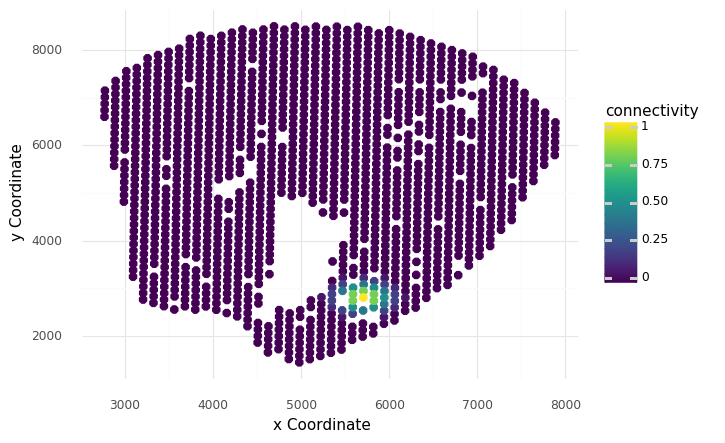

<ggplot: (8792192656418)>

In [8]:
## TODO flip coordinates
li.pl.connectivity_plot(adata, idx=1, spatial_key='spatial', connectivity_key='spatial_connectivities')

In [9]:
adata.uns['global_res'].sort_values('global_mean').tail(10)

,ligand,receptor,ligand_means,ligand_props,receptor_means,receptor_props,interaction,global_mean,global_sd
978,Calr,Itgav,2.058757,0.969986,0.899687,0.724420,Calr&Itgav,0.785854,0.102754
364,App,Aplp2,1.412246,0.875171,1.263897,0.836971,App&Aplp2,0.786285,0.120592
1153,Egf,Lrp2,1.847275,0.879263,2.020214,0.918145,Egf&Lrp2,0.815364,0.082416
1168,Lpl,Lrp2,1.402323,0.836289,2.020214,0.918145,Lpl&Lrp2,0.816358,0.117614
1156,Apoe,Lrp2,1.523888,0.897681,2.020214,0.918145,Apoe&Lrp2,0.824569,0.082452
1178,Cubn,Lrp2,1.150116,0.746930,2.020214,0.918145,Cubn&Lrp2,0.826361,0.137807
1170,Lrpap1,Lrp2,1.522354,0.875853,2.020214,0.918145,Lrpap1&Lrp2,0.868569,0.100110
388,App,Rpsa,1.412246,0.875171,2.691449,0.993179,App&Rpsa,0.892186,0.061792
1177,Hspa8,Lrp2,2.662398,0.993179,2.020214,0.918145,Hspa8&Lrp2,0.908413,0.070073
1174,Tcn2,Lrp2,2.582618,0.991814,2.020214,0.918145,Tcn2&Lrp2,0.924192,0.070525


In [10]:
# save results as modalities
local_lr = li.fun.obsm_to_adata(adata, 'local_scores')
# local_pvals = li.fun.obsm_to_adata(adata, 'local_pvals']

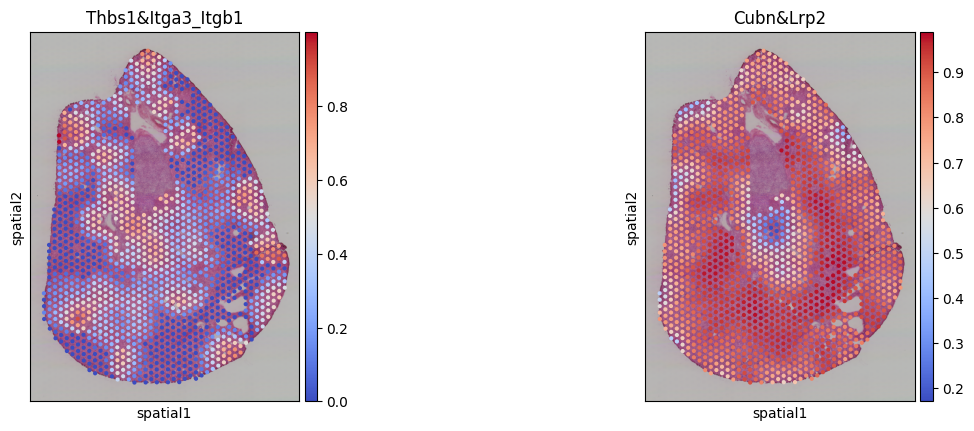

In [11]:
sc.pl.spatial(local_lr, color=['Thbs1&Itga3_Itgb1', 'Cubn&Lrp2'], cmap='coolwarm')

## Run NMF on the whole Dataset

In [12]:
from sklearn.decomposition import NMF

Bind all LR results

In [13]:
lrdatas = dict()
for sample in mdatas.keys():
    lrdatas[sample] = mdatas[sample].mod['lrs']

In [14]:
lrdata_all = sc.concat(lrdatas, join='outer', fill_value=0)

In [15]:
lrdata_all

AnnData object with n_obs × n_vars = 8753 × 941
    obs: 'sample', 'leiden'
    obsm: 'cytosig_estimate', 'dorothea_estimate', 'local_scores', 'progeny_estimate', 'spatial', 'tangram_ct_pred'

### Reconstruction Error NMF

In [16]:
import matplotlib.pyplot as plt

In [17]:
X = lrdata_all.X

In [18]:
def calculate_reconstruction_error(X, n):
    model = NMF(n_components=n, random_state=0)  # Create NMF model
    W = model.fit_transform(X)  # Compute NMF decomposition
    H = model.components_
    Xhat = np.dot(W, H)
    error = np.mean(np.sqrt((X - Xhat) ** 2))  # Reconstruction error
    return error


In [19]:
n_values = range(1, 20)

In [20]:
errors = []
for n in n_values:
    error = calculate_reconstruction_error(X, n)  # X is your input data
    errors.append(error)


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve con

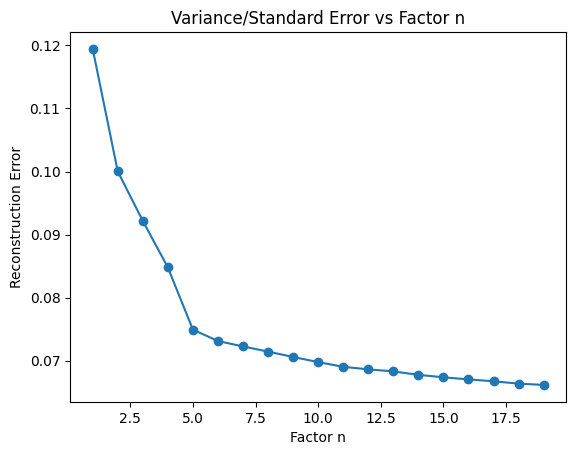

In [21]:
plt.plot(n_values, errors, marker='o')
plt.xlabel('Factor n')
plt.ylabel('Reconstruction Error')
plt.title('Variance/Standard Error vs Factor n')
plt.show()

### NMF

In [22]:
# Create an instance of the NMF class
model = NMF(n_components=5, init='random', random_state=0)

# Fit the model to the data and obtain the factorized matrices
W = model.fit_transform(lrdata_all.X)
H = model.components_

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/sklearn/decomposition/_nmf.py:1665: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.


In [23]:
 ## NOTE take index from adata.obs.index, not from the obsm matrix
columns = [f"Factor{i+1}" for i in range(W.shape[1])]
lrdata_all.obsm['NMF_W'] = pd.DataFrame(W, index=lrdata_all.obs.index, columns=columns)
lrdata_all.varm['NMF_H'] = H.T # NOTE I don't convert to dataframe, because it does not get filtered

## Pathway Enrichment on Ligand-Receptor Factor Loadings

In [24]:
lr_loadings = pd.DataFrame(lrdata_all.varm['NMF_H'], index=lrdata_all.var.index, columns=columns)

In [25]:
lr_loadings

,Factor1,Factor2,Factor3,Factor4,Factor5
interaction,,,,,
Ace&Bdkrb2,0.000000,0.000000,0.117068,0.000000,0.000000
Actr2&Ldlr,0.257075,0.199377,0.255185,0.000000,0.268720
Actr2&Lrp2,0.707641,0.266504,0.415300,0.670543,0.226825
Ada&Dpp4,0.003847,0.000000,0.000000,0.005010,0.121522
Adam10&Axl,0.263149,0.379823,0.302814,0.323080,0.386462
...,...,...,...,...,...
Wnt7b&Fzd4_Lrp6,0.117901,0.152193,0.000000,0.000000,0.191545
Wnt7b&Tmed5,0.076071,0.150963,0.234166,0.321131,0.254598
Wnt9b&Fzd1_Lrp6,0.000000,0.095719,0.003750,0.000000,0.000000


In [26]:
# load PROGENy pathways
net = dc.get_progeny(organism='Mus musculus', top=5000)

# load full list of ligand-receptor pairs
lr_pairs = li.resource.select_resource('mouseconsensus')

# generate ligand-receptor geneset
lr_progeny = li.fun.generate_lr_geneset(lr_pairs, net, lr_separator="&") # NOTE I should change & to & in basis for consistency
lr_progeny.head()

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


,source,interaction,weight
1,EGFR,Dll1&Notch1,-1.000584
31,EGFR,Adam10&Notch1,-0.924934
37,MAPK,Adam10&Notch1,-0.925038
58,WNT,Tnf&Notch1,-1.513049
98,WNT,Adam17&Notch1,-0.951469


In [27]:
estimate, pvals = dc.run_mlm(lr_loadings.transpose(), lr_progeny, source="source", target="interaction", use_raw=False)

In [28]:
estimate

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
Factor1,0.936162,0.619596,-3.247855,1.165668,-0.230561,-1.034806,-0.091909,-2.207103,3.218809,-1.406951,-0.531912,-0.006362,0.527294,0.616133
Factor2,-2.323035,0.442587,-1.673276,-0.511566,-0.981888,-2.659491,-0.312759,-1.547797,5.558360,0.561222,-1.876415,-2.622426,-1.824362,2.660703
Factor3,-0.591964,1.459210,-1.755052,3.800344,-1.002537,1.486050,-0.254926,-1.933974,3.685970,-0.043925,-1.515558,0.970982,-2.004860,0.665140
Factor4,-0.770877,0.346471,-2.118590,2.033647,-0.612706,1.325521,0.215158,-1.209687,0.509508,-0.130213,-1.561202,-0.381620,-0.508183,1.227054
Factor5,-2.574286,2.732478,-2.195041,1.285483,-1.059543,-1.378581,0.437998,-1.551088,8.677816,-1.060066,-1.748170,-0.009163,-1.463666,0.570492


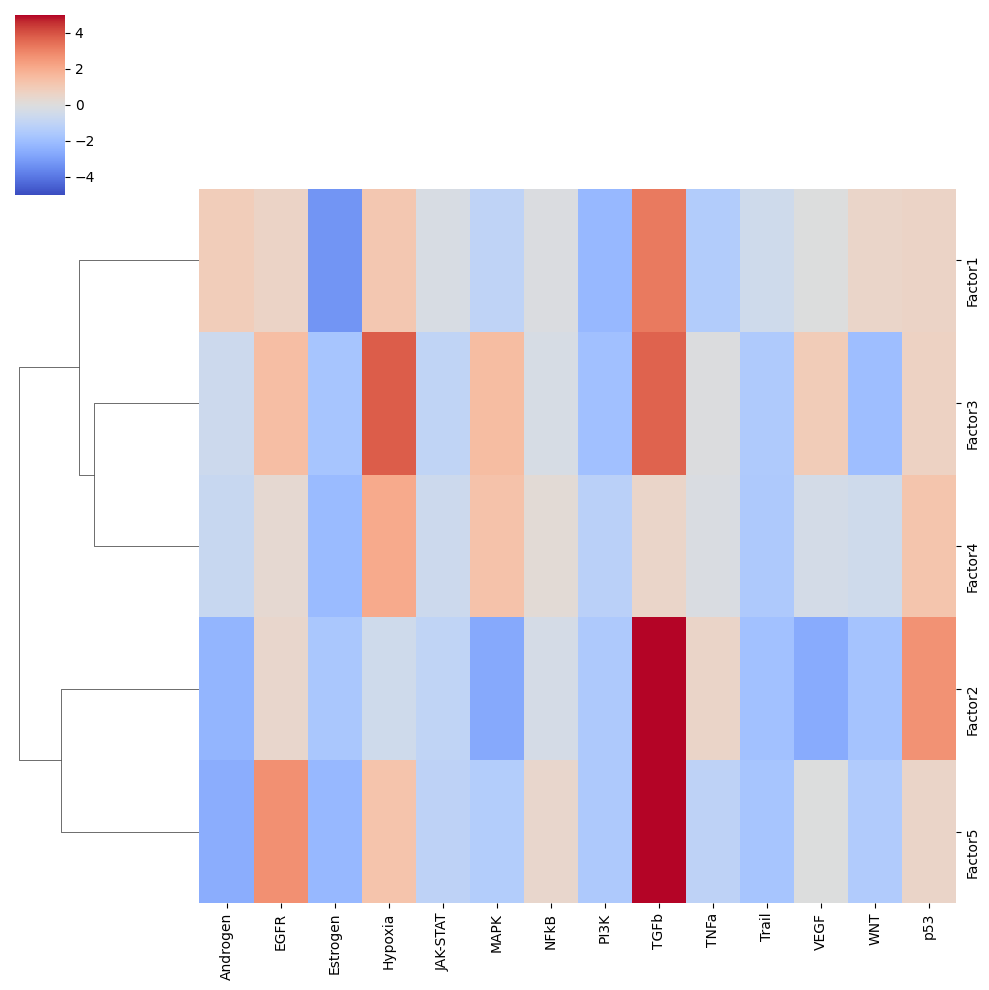

In [29]:
sns.clustermap(estimate, cmap='coolwarm', center=0, vmin=-5, vmax=5, col_cluster=False)

### Transfer NMF factors to the individual samples

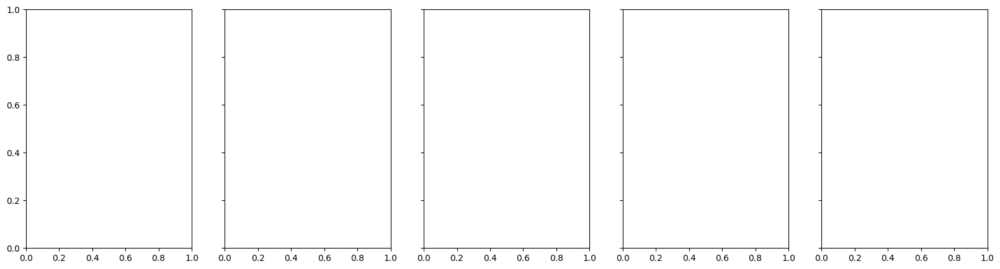

In [30]:
fig, ax = plt.subplots(1,5, figsize=(20, 5), sharex=True, sharey=True)

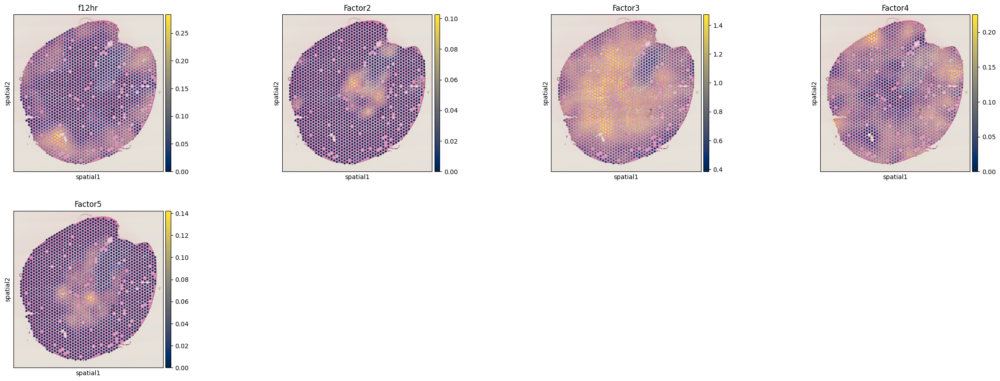

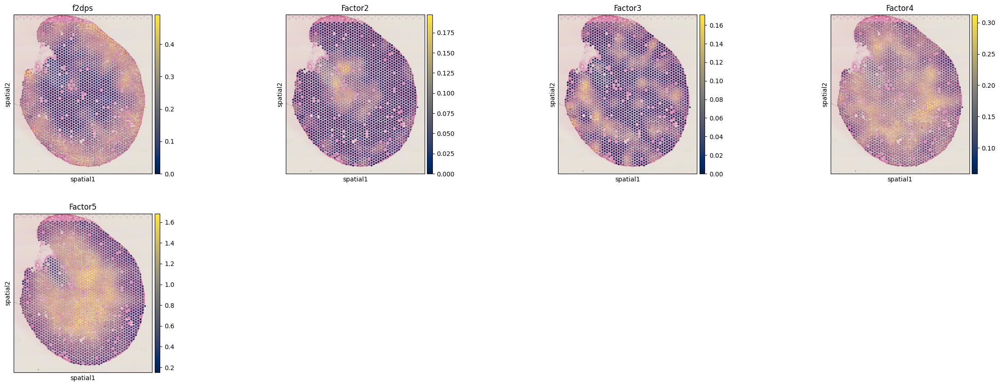

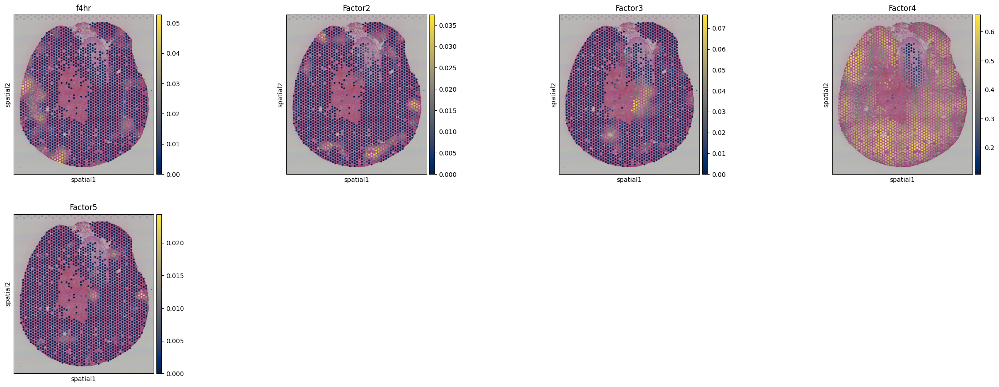

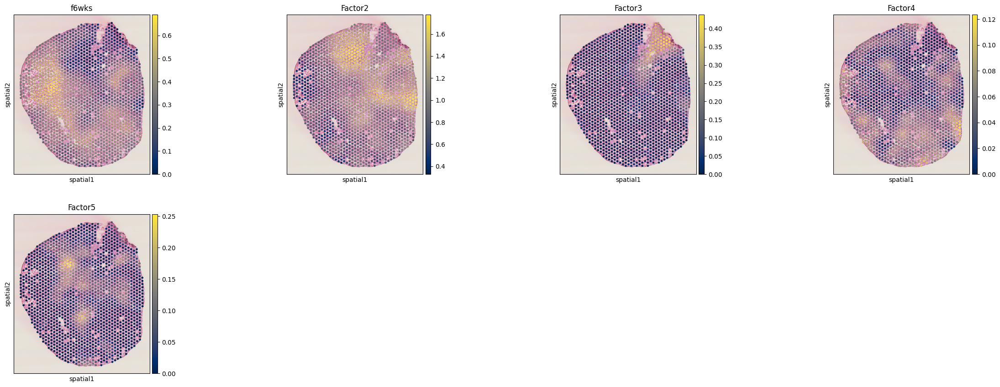

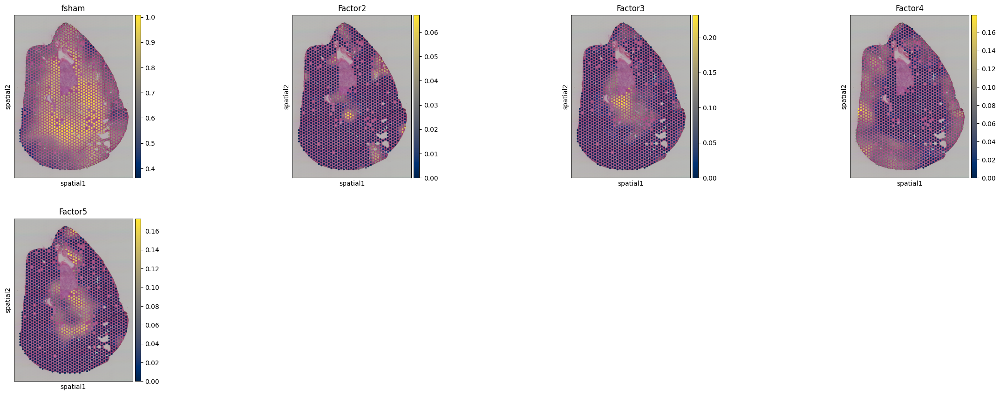

In [31]:
n = 0
# transfer the NMF factors to the individual samples
for sample in lrdatas:
    # each
    lrdata = lrdatas[sample]
    
    # Get the NMF factors for the current sample from the full dataset
    temp = lrdata_all[lrdata_all.obs.index.isin(lrdata.obs.index), :]
    temp = temp[:, temp.var.index.isin(lrdata.var.index)]
    
    # extract from obsm
    ## TODO need to figure out how to handle .obsm & .uns - they keep getting copied over
    ad_nmf = li.fun.obsm_to_adata(temp, obsm_key='NMF_W', _uns=lrdata.uns)
    
    # plot
    sc.pl.spatial(ad_nmf, color=temp.obsm['NMF_W'].columns, cmap='cividis', title=sample)
                  # , ax=ax[n], vmax=1, vmin=0) # 
    
    # save to MuData
    mdatas[sample].mod['nmf'] = ad_nmf
    n=n+1

In [32]:
fig.clear()

In [33]:
# overwrite the old mdatas
for sample in mdatas.keys():
    mdatas[sample].write(os.path.join(data_dir, "mdatas", sample + ".h5ad"))

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.
/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


In [34]:
lrdata_all.write_h5ad("../../data/kidney_injury/lrs_all_factors.h5ad")

In [35]:
deconv = mdatas['f12hr'].mod['tangram']

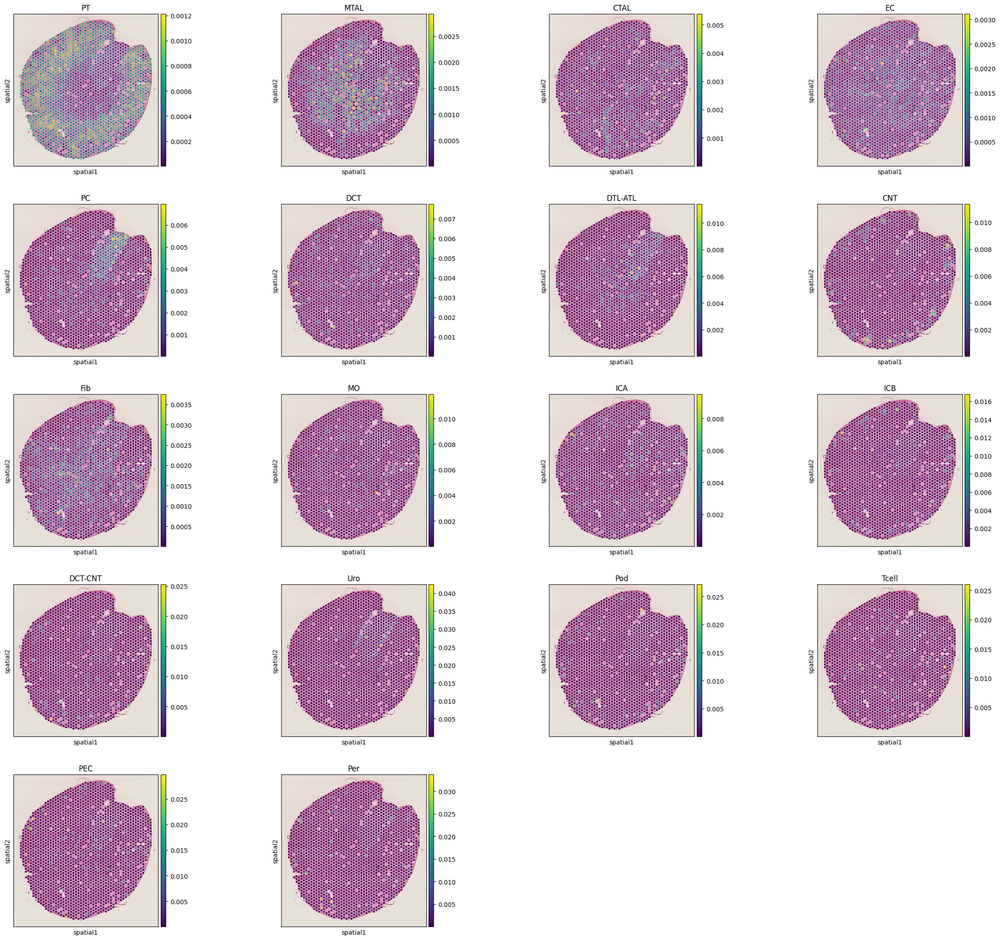

In [36]:
sc.pl.spatial(deconv, color=deconv.var_names)

### Mitsy

In [37]:
from liana.mt.sp._misty_constructs import lrMistyData, genericMistyData

In [38]:
from liana.pl._misty_plots import plot_target_metrics, plot_interactions, plot_contributions

In [39]:
mdata = mdatas['f12hr']
mdata

MuData object with n_obs × n_vars = 1816 × 15528
  7 modalities
    rna:	1816 x 14640
      obs:	'sample', 'leiden'
      var:	'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
      uns:	'global_res', 'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'local_scores', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
      layers:	'counts'
      obsp:	'spatial_connectivities'
    cytosig:	1816 x 43
      obs:	'sample', 'leiden'
      uns:	'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
    progeny:	1816 x 14
      obs:	'sample', 'leiden'
      uns:	'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
    dorothea:	1816 x 272
      obs:	'sample', 'leiden'
      uns:	'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
    tangram:	1816 x 18
      obs:	'sample', 'leiden'
      uns:	'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
    lrs:	1816 x 536
      obs:	'sample', 'leiden'
      uns:	'global_res', 'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'local_scores', 'progeny_estimate', 'spatial', 'tangram_ct_pred'
      obsp:	'spatial_connectivities'
    nmf:	1816 x 5
      obs:	'sample', 'leiden'
      uns:	'global_res', 'log1p', 'spatial'
      obsm:	'cytosig_estimate', 'dorothea_estimate', 'local_scores', 'progeny_estimate', 'spatial', 'tangram_ct_pred', 'NMF_W'

In [49]:
misty = genericMistyData(intra=mdata.mod['progeny'], extra=mdata.mod['dorothea'], bandwidth=200, cutoff=0.05, kernel="gaussian")

/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


In [50]:
misty

MuData object with n_obs × n_vars = 1816 × 558
  obs:	'sample', 'leiden'
  3 modalities
    intra:	1816 x 14
      obs:	'sample', 'leiden'
      obsm:	'spatial'
    juxta:	1816 x 272
      obsm:	'spatial'
      obsp:	'spatial_connectivities'
    para:	1816 x 272
      obsm:	'spatial'
      obsp:	'spatial_connectivities'

In [64]:
misty(verbose=True, model='linear', bypass_intra=True)

Now learning: progeny:p53: 100%|██████████| 14/14 [00:10<00:00,  1.28it/s]    


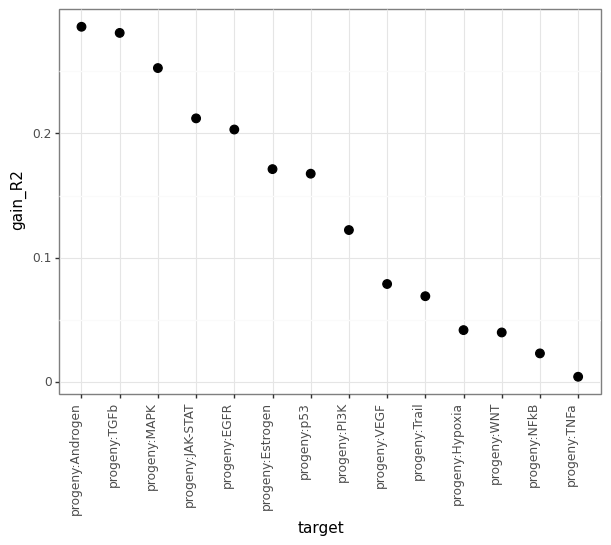

<ggplot: (8792179995534)>

In [67]:
plot_target_metrics(misty, stat='gain_R2', return_fig=True)

In [68]:
misty.uns['target_metrics']

,target,intra_R2,multi_R2,gain_R2,juxta,para
0,progeny:Androgen,0,0.285653,0.285653,0.371598,0.628402
1,progeny:EGFR,0,0.203062,0.203062,0.272463,0.727537
2,progeny:Estrogen,0,0.171240,0.171240,0.399488,0.600512
3,progeny:Hypoxia,0,0.041844,0.041844,0.000000,1.000000
4,progeny:JAK-STAT,0,0.212034,0.212034,0.518888,0.481112
5,progeny:MAPK,0,0.252460,0.252460,0.394434,0.605566
6,progeny:NFkB,0,0.023124,0.023124,0.454921,0.545079
7,progeny:PI3K,0,0.122273,0.122273,0.391911,0.608089
8,progeny:TGFb,0,0.280717,0.280717,0.335383,0.664617
9,progeny:TNFa,0,0.004345,0.004345,0.101581,0.898419


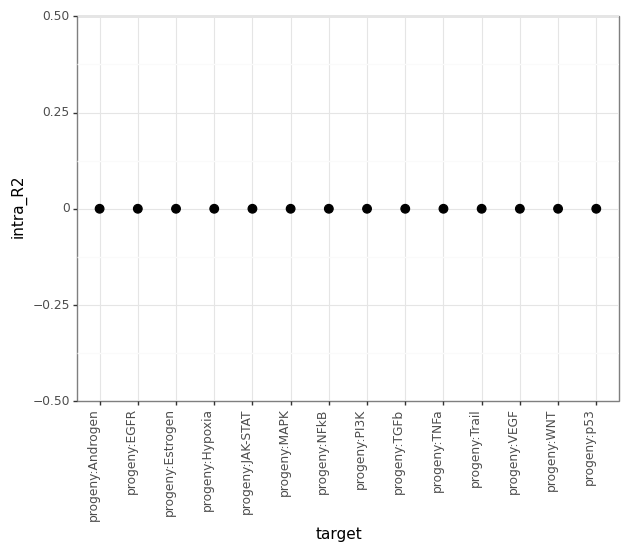

<ggplot: (8792179966862)>

In [69]:
plot_target_metrics(misty, stat='intra_R2', return_fig=True)

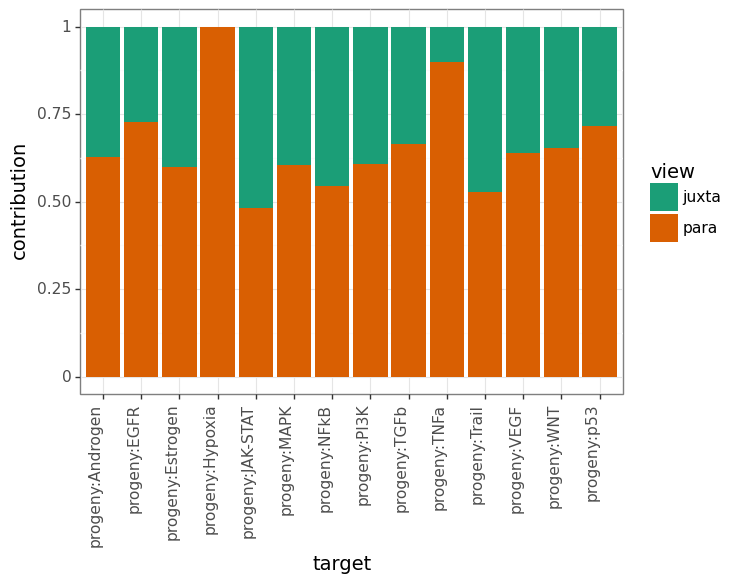

<ggplot: (8792179966382)>

In [70]:
plot_contributions(misty)

In [72]:
misty.uns['interactions'].sort_values('importances', ascending=True).head(20)

,target,predictor,intra_group,extra_group,view,importances
5061,progeny:JAK-STAT,Pax8,None,None,para,-0.151128
7423,progeny:p53,Hes1,None,None,para,-0.142296
4313,progeny:EGFR,Tcf7l1,None,None,para,-0.137736
6149,progeny:TGFb,Pax8,None,None,para,-0.133986
4819,progeny:Hypoxia,Rxrb,None,None,para,-0.126539
6174,progeny:TGFb,Rreb1,None,None,para,-0.114532
5086,progeny:JAK-STAT,Rreb1,None,None,para,-0.111324
6080,progeny:TGFb,Irf4,None,None,para,-0.110743
6198,progeny:TGFb,Sp2,None,None,para,-0.110401
5026,progeny:JAK-STAT,Myb,None,None,para,-0.109134


LR Misty

In [73]:
adata = mdatas['f12hr']['rna']

In [74]:
misty = lrMistyData(adata, resource_name="MouseConsensus", nz_threshold=0.2, bandwidth=200, cutoff=0.05, kernel='gaussian', verbose=True)

Using `.X`!


/home/dbdimitrov/anaconda3/envs/spiana/lib/python3.10/site-packages/mudata/_core/mudata.py:458: UserWarning: Cannot join columns with the same name because var_names are intersecting.


In [77]:
misty(verbose=True, model='linear', bypass_intra=True)

Now learning: Itgal: 100%|██████████| 510/510 [02:38<00:00,  3.21it/s]              


In [90]:
## NOTE: we get some perfect predictions (i.e. I should include a filter of genes in R, not to be in L)

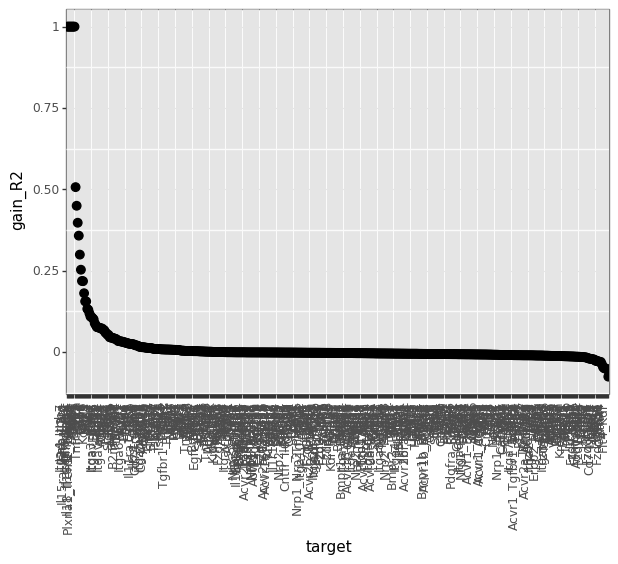

<ggplot: (8792180212923)>

In [82]:
plot_target_metrics(misty, stat='gain_R2', return_fig=True)

In [89]:
misty.uns['target_metrics'].sort_values('gain_R2', ascending=False).head(20)

,target,intra_R2,multi_R2,gain_R2,extra
97,Itga4_Itgb7,0,1.000000,1.000000,NaN
331,Il2rb_Il2rg,0,1.000000,1.000000,NaN
313,Il15ra_Il2rb_Il2rg,0,1.000000,1.000000,NaN
340,Gfra1_Ret,0,1.000000,1.000000,NaN
36,Itgax_Itgb2,0,1.000000,1.000000,NaN
347,Gfra2_Ret,0,1.000000,1.000000,NaN
336,Il18_Il18r1_Il18rap,0,1.000000,1.000000,NaN
133,Plxna1_Trem2_Tyrobp,0,1.000000,1.000000,NaN
161,Bcam,0,0.506926,0.506926,1.0
44,Rpsa,0,0.449690,0.449690,1.0


In [88]:
misty.uns['interactions'].sort_values('importances', ascending=False)

,target,predictor,intra_group,extra_group,view,importances
57557,Cd9,Vegfb,None,None,extra,0.097508
38555,Pth1r,Cd34,None,None,extra,0.090323
2680,Itgb1,Cdh1,None,None,extra,0.082871
25266,Bcam,Vegfb,None,None,extra,0.081319
21299,Plxnb2,Lamc1,None,None,extra,0.073489
...,...,...,...,...,...,...
40045,Thbd,Ptdss1,None,None,extra,-0.077439
19422,Itgav,Kl,None,None,extra,-0.078146
61378,Kcnj15,Hspa8,None,None,extra,-0.083110
47655,Il11ra1_Il6st,Il11ra1,None,None,extra,-0.085287
